In [12]:
pip install datasets transformers accelerate peft bitsandbytes pillow huggingface_hub


Note: you may need to restart the kernel to use updated packages.


In [13]:
pip install trl


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 10.7 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [15]:
from huggingface_hub import list_repo_files

repo_id = "DriveQA/DriveQA_Dataset"

files = list_repo_files(repo_id=repo_id, repo_type="dataset")

print("📂 Fichiers disponibles dans le dataset :")
for f in files:
    print("-", f)


📂 Fichiers disponibles dans le dataset :
- .gitattributes
- DriveQA_T.jsonl
- DriveQA_T_HardSet.jsonl
- DriveQA_V_Intersections_CARLA.jsonl
- DriveQA_V_TrafficSigns_CARLA.jsonl
- DriveQA_V_TrafficSigns_Mapillary.jsonl
- Intersections_images.tar.gz
- README.md
- TrafficSigns_CARLA_images.tar.gz
- TrafficSigns_Mapillary_images.tar.gz


In [17]:
from huggingface_hub import hf_hub_download

repo_id = "DriveQA/DriveQA_Dataset"

# annotations
ann_path = hf_hub_download(repo_id, "DriveQA_V_Intersections_CARLA.jsonl", repo_type="dataset")
img_tar_path = hf_hub_download(repo_id, "Intersections_images.tar.gz", repo_type="dataset")

print("✅ Annotations path:", ann_path)
print("✅ Images tar path:", img_tar_path)


DriveQA_V_Intersections_CARLA.jsonl:   0%|          | 0.00/408M [00:00<?, ?B/s]

✅ Annotations path: /root/.cache/huggingface/hub/datasets--DriveQA--DriveQA_Dataset/snapshots/e288ffd409d7871711fc874d86f00308b0cd8c42/DriveQA_V_Intersections_CARLA.jsonl
✅ Images tar path: /root/.cache/huggingface/hub/datasets--DriveQA--DriveQA_Dataset/snapshots/e288ffd409d7871711fc874d86f00308b0cd8c42/Intersections_images.tar.gz


In [18]:
import tarfile
from pathlib import Path

extract_dir = Path("./driveqa_images/intersections")
extract_dir.mkdir(parents=True, exist_ok=True)

with tarfile.open(img_tar_path, "r:gz") as tar:
    tar.extractall(path=extract_dir)

print("✅ Images extraites dans :", extract_dir.resolve())


✅ Images extraites dans : /kaggle/working/driveqa_images/intersections


✅ 3) Charger le fichier JSONL (questions/options/réponses)

In [19]:
import json

data = []
with open(ann_path, "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line))

print("✅ Nombre d'exemples :", len(data))
print("✅ Exemple :", data[0])


✅ Nombre d'exemples : 432984
✅ Exemple : {'type': 'T_intersection_top_view', 'image': 'intersection_VQA/T_intersection/seed2025//top_view/Town01/images/seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg', 'question': 'Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Red car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)', 'optionA': 'Red car', 'optionB': 'Yellow car', 'optionC': 'No one needs to yield because there is no conflict.', 'optionD': 'None of the above.', 'question_id': 1, 'answer': 2, 'answer_explained': 'All vehicles can proceed simultaneously because their intended paths do not intersect or overlap at any point.'}


In [20]:
print(data[0].keys())


dict_keys(['type', 'image', 'question', 'optionA', 'optionB', 'optionC', 'optionD', 'question_id', 'answer', 'answer_explained'])


In [23]:
print(data[0].keys())
print(data[0])


dict_keys(['type', 'image', 'question', 'optionA', 'optionB', 'optionC', 'optionD', 'question_id', 'answer', 'answer_explained'])
{'type': 'T_intersection_top_view', 'image': 'intersection_VQA/T_intersection/seed2025//top_view/Town01/images/seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg', 'question': 'Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Red car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)', 'optionA': 'Red car', 'optionB': 'Yellow car', 'optionC': 'No one needs to yield because there is no conflict.', 'optionD': 'None of the above.', 'question_id': 1, 'answer': 2, 'answer_explained': 'All vehicles can proceed simultaneously because their intended paths do not intersect or overlap at any point.'}


In [24]:
from pathlib import Path
from PIL import Image

# dossier où tu as extrait les images
extract_dir = Path("./driveqa_images/intersections")

# exemple
example = data[0]

# le path relatif dans le json
image_rel_path = example["image"]

# path complet
img_path = extract_dir / image_rel_path

# vérifier si le fichier existe
print("📌 Image path :", img_path)
print("📌 Exists ?", img_path.exists())

# afficher l'image
if img_path.exists():
    img = Image.open(img_path)
    img.show()
else:
    print("❌ Image non trouvée, vérifie le dossier d'extraction")
    
# afficher la question + options + réponse
print("\n❓ Question :", example["question"])
print("A:", example["optionA"])
print("B:", example["optionB"])
print("C:", example["optionC"])
print("D:", example["optionD"])
print("✅ Réponse correcte:", example["answer"])
print("💡 Explication:", example["answer_explained"])


📌 Image path : driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/top_view/Town01/images/seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg
📌 Exists ? True

❓ Question : Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Red car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)
A: Red car
B: Yellow car
C: No one needs to yield because there is no conflict.
D: None of the above.
✅ Réponse correcte: 2
💡 Explication: All vehicles can proceed simultaneously because their intended paths do not intersect or overlap at any point.


Error: no "view" mailcap rules found for type "image/png"
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmp7wreq86u.PNG'


In [26]:
# 🔹 0️⃣ Import des librairies
import json
from pathlib import Path
from PIL import Image
from IPython.display import display


In [27]:
# 🔹 1️⃣ Définir le dossier d'extraction des images et le fichier JSONL

# dossier où tu as extrait les images depuis Intersections_images.tar.gz
extract_dir = Path("./driveqa_images/intersections")

# fichier JSONL des annotations
jsonl_file = Path("./driveqa_data/DriveQA_V_Intersections_CARLA.jsonl")


In [30]:
from pathlib import Path
from huggingface_hub import hf_hub_download

# Repo HuggingFace
repo_id = "DriveQA/DriveQA_Dataset"

# Télécharger le fichier JSONL si ce n'est pas déjà fait
jsonl_file = hf_hub_download(
    repo_id=repo_id,
    filename="DriveQA_V_Intersections_CARLA.jsonl",
    repo_type="dataset"
)

# Télécharger le tar.gz des images
img_tar_path = hf_hub_download(
    repo_id=repo_id,
    filename="Intersections_images.tar.gz",
    repo_type="dataset"
)

# Créer le dossier d'extraction
extract_dir = Path("./driveqa_images/intersections")
extract_dir.mkdir(parents=True, exist_ok=True)

print("📌 JSONL path :", jsonl_file)
print("📌 Images tar.gz path :", img_tar_path)
print("📌 Dossier d'extraction :", extract_dir.resolve())


📌 JSONL path : /root/.cache/huggingface/hub/datasets--DriveQA--DriveQA_Dataset/snapshots/e288ffd409d7871711fc874d86f00308b0cd8c42/DriveQA_V_Intersections_CARLA.jsonl
📌 Images tar.gz path : /root/.cache/huggingface/hub/datasets--DriveQA--DriveQA_Dataset/snapshots/e288ffd409d7871711fc874d86f00308b0cd8c42/Intersections_images.tar.gz
📌 Dossier d'extraction : /kaggle/working/driveqa_images/intersections


In [31]:
import tarfile

with tarfile.open(img_tar_path, "r:gz") as tar:
    tar.extractall(path=extract_dir)

print("✅ Images extraites dans :", extract_dir.resolve())


✅ Images extraites dans : /kaggle/working/driveqa_images/intersections


In [32]:
import json

data = []
with open(jsonl_file, "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line))

print("✅ Nombre d'exemples dans le dataset :", len(data))
print("✅ Clés disponibles :", data[0].keys())


✅ Nombre d'exemples dans le dataset : 432984
✅ Clés disponibles : dict_keys(['type', 'image', 'question', 'optionA', 'optionB', 'optionC', 'optionD', 'question_id', 'answer', 'answer_explained'])


In [34]:
# 🔹 3️⃣ Fonction pour visualiser un exemple (image + question + options + réponse)
def visualize_example(example, extract_dir):
    # path de l'image
    img_path = extract_dir / example["image"]
    
    if img_path.exists():
        img = Image.open(img_path)
        display(img)
    else:
        print("❌ Image non trouvée :", img_path)
    
    # afficher la question, options et réponses
    print("\n❓ Question :", example["question"])
    print("A:", example["optionA"])
    print("B:", example["optionB"])
    print("C:", example["optionC"])
    print("D:", example["optionD"])
    print("✅ Réponse correcte (numéro) :", example["answer"])
    # afficher la réponse exacte en texte
    answer_map = {"1":"A","2":"B","3":"C","4":"D"}
    correct_option = answer_map.get(str(example["answer"]), "Inconnu")
    print("✅ Réponse correcte (lettre) :", correct_option)
    print("💡 Explication :", example["answer_explained"])


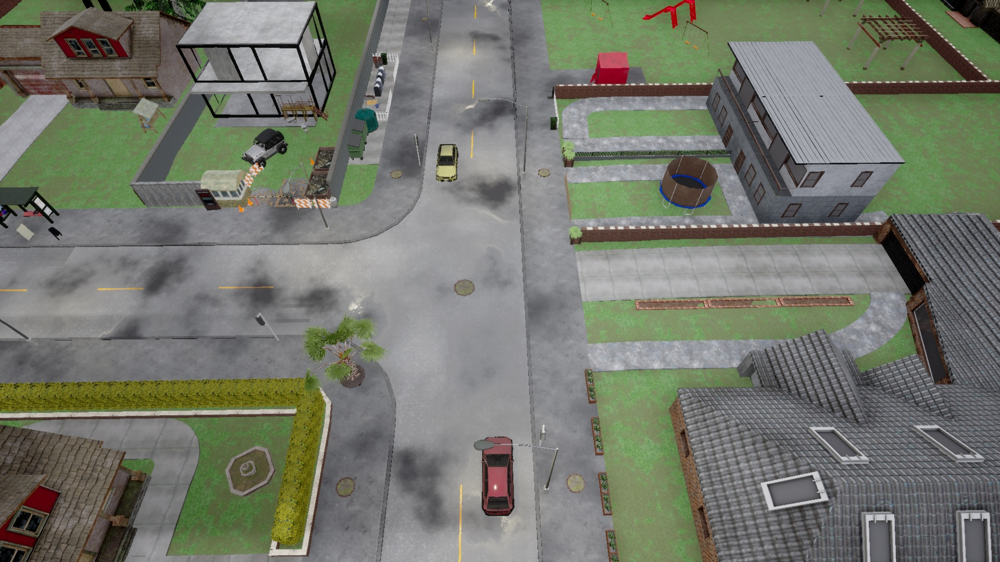


❓ Question : Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Red car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)
A: Red car
B: Yellow car
C: No one needs to yield because there is no conflict.
D: None of the above.
✅ Réponse correcte (numéro) : 2
✅ Réponse correcte (lettre) : B
💡 Explication : All vehicles can proceed simultaneously because their intended paths do not intersect or overlap at any point.


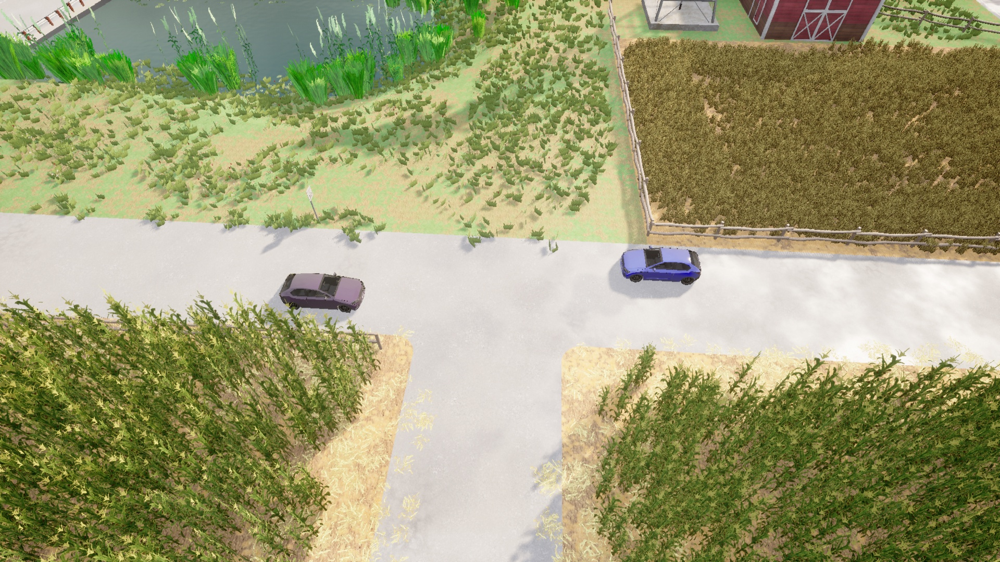


❓ Question : Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Blue car will turn left. The Purple car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)
A: Blue car
B: Purple car
C: No one needs to yield because there is no conflict.
D: None of the above.
✅ Réponse correcte (numéro) : 1
✅ Réponse correcte (lettre) : A
💡 Explication : The Purple car going straight has priority over the Blue car(s) turning left because going straight have priority over turning left.


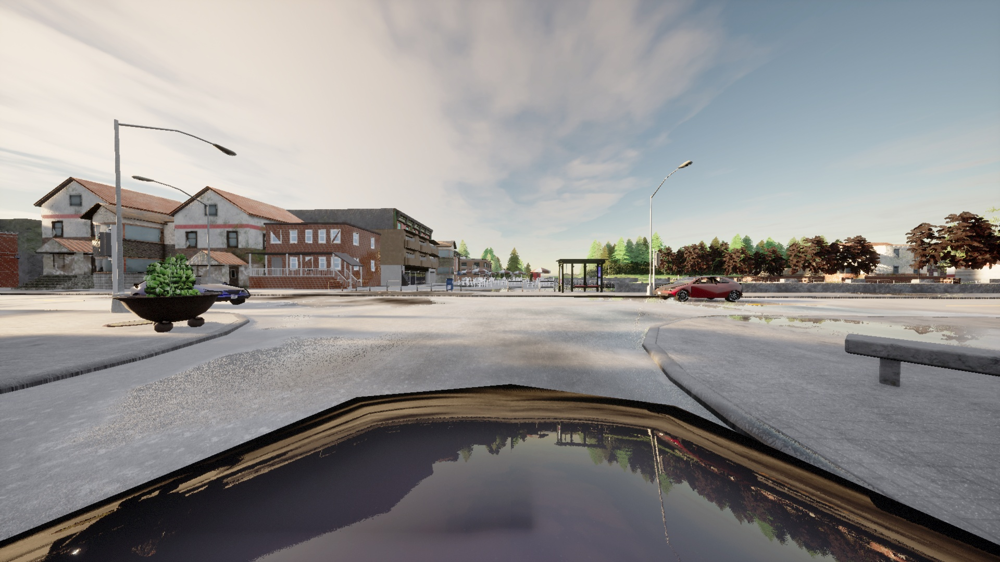


❓ Question : Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The ego car will turn left. The Red car will go straight. The Blue car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)
A: The ego car
B: Red car
C: Blue car
D: No one needs to yield because there is no conflict.
✅ Réponse correcte (numéro) : 1
✅ Réponse correcte (lettre) : A
💡 Explication : The Red car going straight on the main road has priority over the The ego car(s) on the stem road; The Red car going straight has priority over the The ego car(s) turning left because going straight have priority over turning left.


In [37]:
visualize_example(data[0], extract_dir)
visualize_example(data[10], extract_dir)
visualize_example(data[20], extract_dir)


In [39]:
# 🔹 5️⃣ Fonction pour transformer un exemple en format fine-tuning VLM
def format_for_vlm(example):
    """
    Transforme chaque exemple JSONL en prompt/answer pour VLM
    """
    # construire le prompt
    prompt = f"""
You are a driving instructor. Analyze the image and situation carefully.

Question: {example['question']}

Options:
A: {example['optionA']}
B: {example['optionB']}
C: {example['optionC']}
D: {example['optionD']}

Answer with:
1) Correct option (letter)
2) Explanation
3) Short driving rule
"""

    # réponse attendue
    answer_map = {"1":"A","2":"B","3":"C","4":"D"}
    correct_letter = answer_map.get(str(example["answer"]), "Inconnu")
    answer = f"""
Correct Option: {correct_letter}
Explanation: {example['answer_explained']}
Driving Rule: Follow traffic rules and priority based on conflict points.
"""

    return {
        "image": example["image"],  # path relatif
        "prompt": prompt.strip(),
        "answer": answer.strip()
    }


In [40]:
# 🔹 6️⃣ Transformer tout le dataset
dataset_vlm = [format_for_vlm(ex) for ex in data]

print("✅ Dataset transformé pour VLM, nombre d'exemples :", len(dataset_vlm))


✅ Dataset transformé pour VLM, nombre d'exemples : 432984


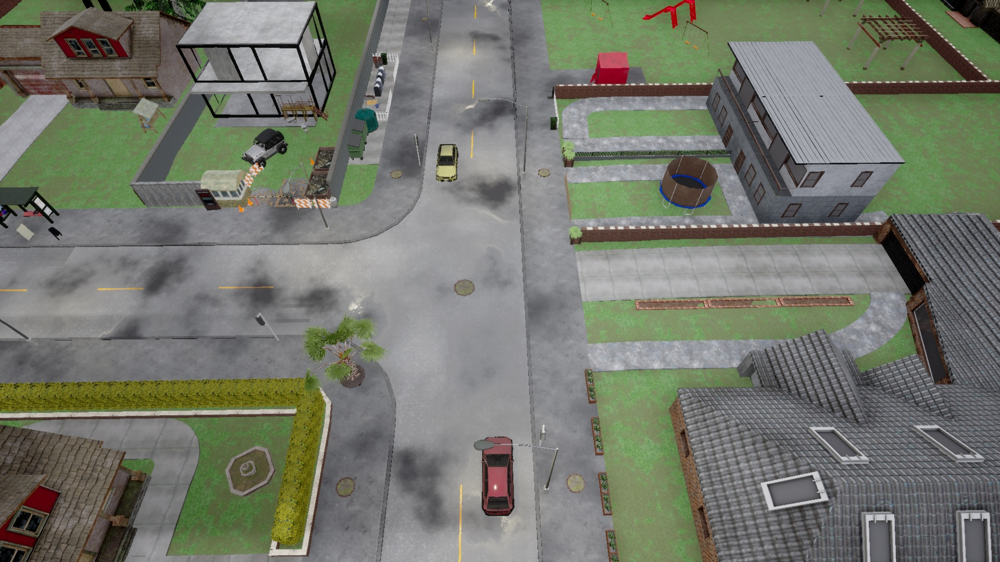


📌 Prompt :
 You are a driving instructor. Analyze the image and situation carefully.

Question: Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Red car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)

Options:
A: Red car
B: Yellow car
C: No one needs to yield because there is no conflict.
D: None of the above.

Answer with:
1) Correct option (letter)
2) Explanation
3) Short driving rule

📌 Answer :
 Correct Option: B
Explanation: All vehicles can proceed simultaneously because their intended paths do not intersect or overlap at any point.
Driving Rule: Follow traffic rules and priority based on conflict points.


In [41]:
# 🔹 7️⃣ Afficher un exemple transformé (prêt pour fine-tuning)
example_vlm = dataset_vlm[0]

# chemin complet de l'image
img_path = extract_dir / example_vlm["image"]
if img_path.exists():
    img = Image.open(img_path)
    display(img)

print("\n📌 Prompt :\n", example_vlm["prompt"])
print("\n📌 Answer :\n", example_vlm["answer"])


In [42]:
# 🔹 8️⃣ Optionnel : sauvegarder le dataset transformé pour fine-tuning
import pickle

output_file = Path("./driveqa_vlm_dataset.pkl")
with open(output_file, "wb") as f:
    pickle.dump(dataset_vlm, f)

print("✅ Dataset VLM sauvegardé :", output_file.resolve())


✅ Dataset VLM sauvegardé : /kaggle/working/driveqa_vlm_dataset.pkl


In [43]:
import random

# Choisir aléatoirement 5% du dataset
subset_ratio = 0.05
subset_size = int(len(dataset_vlm) * subset_ratio)

dataset_subset = random.sample(dataset_vlm, subset_size)
print(f"✅ Subset créé : {subset_size} exemples sur {len(dataset_vlm)}")


✅ Subset créé : 21649 exemples sur 432984


Pour QLoRA, on a besoin d’un dataset HuggingFace Dataset avec :

"image" → path

"prompt" → texte

"answer" → texte

In [44]:
from datasets import Dataset

# convertir en HuggingFace Dataset
hf_dataset = Dataset.from_list(dataset_subset)

print(hf_dataset)


Dataset({
    features: ['image', 'prompt', 'answer'],
    num_rows: 21649
})


In [45]:
pip install transformers accelerate peft bitsandbytes datasets


Note: you may need to restart the kernel to use updated packages.


In [51]:
from pathlib import Path

extract_dir = Path("./driveqa_images/intersections")
all_images = list(extract_dir.rglob("*.jpg"))
print("Nombre d'images extraites :", len(all_images))
print("Exemples :", all_images[:5])


Nombre d'images extraites : 19422
Exemples : [PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_ClearSunset_intersection1574_frontview_0030.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_SoftRainNight_intersection53_frontview_0003.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_WetNight_intersection720_frontview_0013.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_HardRainDawn_intersection1722_frontview_0025.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_WetSunset_intersection396_frontview_0005.jpg')]


In [53]:
from transformers import Blip2Processor, Blip2ForConditionalGeneration
from PIL import Image
import torch
from pathlib import Path

# 🔹 Modèle public
model_name = "Salesforce/blip2-flan-t5-xl"

# 🔹 Charger le modèle et le processor
processor = Blip2Processor.from_pretrained(model_name)
model = Blip2ForConditionalGeneration.from_pretrained(
    model_name,
    device_map="auto",  # GPU si dispo
    torch_dtype=torch.float16
)

# 🔹 Exemple d'image réelle depuis le dataset DriveQA
extract_dir = Path("./driveqa_images/intersections")
example_img_path = extract_dir / "intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_ClearSunset_intersection1574_frontview_0030.jpg"

# Vérifier que l'image existe
assert example_img_path.exists(), f"❌ Image non trouvée : {example_img_path}"

# 🔹 Ouvrir l'image
image = Image.open(example_img_path).convert("RGB")

# 🔹 Question exemple
prompt = "Question: Qui a la priorité dans ce rond-point ?"

# 🔹 Préparer les inputs et générer la réponse
inputs = processor(images=image, text=prompt, return_tensors="pt").to("cuda")
output_ids = model.generate(**inputs, max_new_tokens=100)
answer = processor.decode(output_ids[0], skip_special_tokens=True)

print("📌 Chemin de l'image :", example_img_path)
print("📌 Question :", prompt)
print("✅ Réponse générée :", answer)


The `language_model` is not in the `hf_device_map` dictionary and you are running your script in a multi-GPU environment. this may lead to unexpected behavior when using `accelerate`. Please pass a `device_map` that contains `language_model` to remove this warning. Please refer to https://github.com/huggingface/blog/blob/main/accelerate-large-models.md for more details on creating a `device_map` for large models.


📌 Question : Voici une image d'une intersection. Regarde attentivement la situation et répond à la question : Qui a la priorité parmi les véhicules sur cette intersection ? Répond seulement avec le véhicule ou 'aucun' si personne.
✅ Réponse générée :                                                                           


In [54]:
prompt = (
    "Voici une image d'une intersection. "
    "Regarde attentivement la situation et répond à la question : "
    "Qui a la priorité parmi les véhicules sur cette intersection ? "
    "Répond seulement avec le véhicule ou 'aucun' si personne."
)

# Préparer les inputs
inputs = processor(images=image, text=prompt, return_tensors="pt").to("cuda")

# Générer la réponse
output_ids = model.generate(**inputs, max_new_tokens=150)
answer = processor.decode(output_ids[0], skip_special_tokens=True)

print("📌 Question :", prompt)
print("✅ Réponse générée :", answer)


The `language_model` is not in the `hf_device_map` dictionary and you are running your script in a multi-GPU environment. this may lead to unexpected behavior when using `accelerate`. Please pass a `device_map` that contains `language_model` to remove this warning. Please refer to https://github.com/huggingface/blog/blob/main/accelerate-large-models.md for more details on creating a `device_map` for large models.


📌 Question : Voici une image d'une intersection. Regarde attentivement la situation et répond à la question : Qui a la priorité parmi les véhicules sur cette intersection ? Répond seulement avec le véhicule ou 'aucun' si personne.
✅ Réponse générée :                                                                           


In [59]:
from pathlib import Path

img_folder = Path("driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/")
all_images = list(img_folder.glob("*.jpg"))  # récupère toutes les jpg
print(all_images[:5])  # affiche les 5 premières pour vérifier


[PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_ClearSunset_intersection1574_frontview_0030.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_SoftRainNight_intersection53_frontview_0003.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_WetNight_intersection720_frontview_0013.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_HardRainDawn_intersection1722_frontview_0025.jpg'), PosixPath('driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images/seed2025_Town05_WetSunset_intersection396_frontview_0005.jpg')]


In [92]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from pathlib import Path
from PIL import Image
import json, random, pickle
import torch

# ----------------------------
# 1️⃣ Configuration
# ----------------------------
model_name = "Salesforce/blip-image-captioning-base"
jsonl_file = "/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/T_intersection_VQA.jsonl"
extract_dir_original = Path("/kaggle/working/seed2025/Town01/front_view/images")
subset_size = 5

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"📌 Device utilisé : {device}")

# ----------------------------
# 🔍 DIAGNOSTIC : Trouver le bon chemin des images
# ----------------------------
print("\n🔍 DIAGNOSTIC DES CHEMINS D'IMAGES")
print("="*60)

# Vérifier le dossier spécifié
print(f"📂 Dossier spécifié : {extract_dir_original}")
print(f"   Existe ? {extract_dir_original.exists()}")

if extract_dir_original.exists():
    images = list(extract_dir_original.glob("*.jpg")) + list(extract_dir_original.glob("*.png"))
    print(f"   ✅ Nombre d'images : {len(images)}")
    if images:
        print(f"   📸 Exemples : {[img.name for img in images[:3]]}")

# Chercher tous les dossiers "images" dans /kaggle/working
print("\n🔍 Recherche de tous les dossiers 'images'...")
base_path = Path("/kaggle/working")
all_image_dirs = list(base_path.rglob("images"))
print(f"📂 {len(all_image_dirs)} dossiers trouvés :")
for img_dir in all_image_dirs[:10]:  # Afficher les 10 premiers
    img_count = len(list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.png")))
    print(f"   - {img_dir.relative_to(base_path)} ({img_count} images)")


📌 Device utilisé : cuda

🔍 DIAGNOSTIC DES CHEMINS D'IMAGES
📂 Dossier spécifié : /kaggle/working/seed2025/Town01/front_view/images
   Existe ? False

🔍 Recherche de tous les dossiers 'images'...
📂 22 dossiers trouvés :
   - driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town05/images (1393 images)
   - driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town10HD/images (112 images)
   - driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town03/images (221 images)
   - driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town04/images (888 images)
   - driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/front_view/Town07/images (242 images)
   - driveqa_images/intersections/intersection_VQA/fourway_intersection/seed2025/top_view/Town05/images (4326 images)
   - driveqa_images/intersections/intersection_VQA/fourway_interse

In [94]:
''''from transformers import BlipProcessor, BlipForConditionalGeneration
from pathlib import Path
from PIL import Image
import json, random, pickle
import torch

# ----------------------------
# Configuration
# ----------------------------
model_name = "Salesforce/blip-image-captioning-base"
jsonl_file = "/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/T_intersection_VQA.jsonl"
subset_size = 20  # Augmenté à 20 pour avoir plus d'exemples

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"📌 Device : {device}\n")

# ----------------------------
# Fonction de recherche d'images
# ----------------------------
def find_image_smart(image_field, search_dirs):
    """Trouve l'image intelligemment"""
    if Path(image_field).exists():
        return Path(image_field)
    
    for search_dir in search_dirs:
        img_path = search_dir / image_field
        if img_path.exists():
            return img_path
        
        img_name = Path(image_field).name
        img_path = search_dir / img_name
        if img_path.exists():
            return img_path
        
        matches = list(search_dir.rglob(img_name))
        if matches:
            return matches[0]
    
    return None

# ----------------------------
# Trouver tous les dossiers d'images
# ----------------------------
base_path = Path("/kaggle/working")
all_image_dirs = list(base_path.rglob("images"))
search_directories = [
    Path("/kaggle/working/driveqa_images/intersections"),
    Path("/kaggle/working"),
] + all_image_dirs

print(f"📂 Dossiers de recherche : {len(search_directories)}\n")

# ----------------------------
# Charger le JSONL
# ----------------------------
print("📄 Chargement du dataset...")
data = []
with open(jsonl_file, "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line))

print(f"✅ {len(data)} exemples chargés")

# Analyser la structure
example = data[0]
print(f"\n📋 Structure du JSONL :")
print(f"   Keys : {list(example.keys())}")
print(f"   Question : {example.get('question', '')[:80]}...")
print(f"   Options : A={example.get('optionA', 'N/A')[:30]}...")
print(f"   Réponse : {example.get('answer', 'N/A')}")
print()

# ----------------------------
# Charger le modèle BLIP
# ----------------------------
print("🤖 Chargement du modèle BLIP...")
processor = BlipProcessor.from_pretrained(model_name)
model = BlipForConditionalGeneration.from_pretrained(
    model_name,
    torch_dtype=torch.float16
).to(device)
print(f"✅ Modèle chargé sur {device}\n")

# ----------------------------
# MÉTHODE 1 : Image Captioning Simple
# ----------------------------
print("="*70)
print("🎯 MÉTHODE 1 : IMAGE CAPTIONING (Describe what you see)")
print("="*70)

data_subset = random.sample(data, min(subset_size, len(data)))
dataset_captioning = []

for i, item in enumerate(data_subset[:5], 1):  # Tester sur 5 exemples
    img_field = item.get("image", "")
    img_path = find_image_smart(img_field, search_directories)
    
    if img_path is None:
        continue
    
    print(f"\n[{i}/5] {img_path.name}")
    
    try:
        image = Image.open(img_path).convert("RGB")
        
        # BLIP Captioning : Juste décrire l'image (sans question)
        inputs = processor(images=image, return_tensors="pt").to(device)
        
        with torch.no_grad():
            output_ids = model.generate(**inputs, max_new_tokens=50)
        
        caption = processor.decode(output_ids[0], skip_special_tokens=True)
        
        print(f"   📸 Caption : {caption}")
        
        dataset_captioning.append({
            "image": str(img_path),
            "caption": caption,
            "question": item.get("question", ""),
            "correct_answer": item.get("answer", ""),
        })
        
    except Exception as e:
        print(f"   ⚠️ Erreur : {e}")

# ----------------------------
# MÉTHODE 2 : Visual Question Answering (VQA)
# ----------------------------
print("\n" + "="*70)
print("🎯 MÉTHODE 2 : VISUAL QUESTION ANSWERING (Court et précis)")
print("="*70)

dataset_vqa = []

for i, item in enumerate(data_subset[:5], 1):
    img_field = item.get("image", "")
    img_path = find_image_smart(img_field, search_directories)
    
    if img_path is None:
        continue
    
    print(f"\n[{i}/5] {img_path.name}")
    
    try:
        image = Image.open(img_path).convert("RGB")
        
        # Créer une question COURTE et SIMPLE pour BLIP
        # BLIP n'est pas fait pour des questions longues et complexes
        question_short = "Which car should go first?"  # Question simple
        
        # BLIP VQA avec question courte
        inputs = processor(
            images=image, 
            text=question_short,  # Question courte
            return_tensors="pt"
        ).to(device)
        
        with torch.no_grad():
            output_ids = model.generate(**inputs, max_new_tokens=20)  # Réponse courte
        
        answer = processor.decode(output_ids[0], skip_special_tokens=True)
        
        print(f"   ❓ Question : {question_short}")
        print(f"   🎯 Réponse BLIP : {answer}")
        print(f"   ✅ Réponse correcte : {item.get('answer', 'N/A')}")
        
        dataset_vqa.append({
            "image": str(img_path),
            "question": question_short,
            "answer_blip": answer,
            "question_original": item.get("question", ""),
            "correct_answer": item.get("answer", ""),
            "explanation": item.get("answer_explained", ""),
        })
        
    except Exception as e:
        print(f"   ⚠️ Erreur : {e}")

# ----------------------------
# MÉTHODE 3 : Format d'entraînement avec options multiples
# ----------------------------
print("\n" + "="*70)
print("🎯 MÉTHODE 3 : CRÉATION DU DATASET POUR FINE-TUNING")
print("="*70)

dataset_training = []

for i, item in enumerate(data_subset, 1):
    img_field = item.get("image", "")
    img_path = find_image_smart(img_field, search_directories)
    
    if img_path is None:
        continue
    
    try:
        # Format pour le fine-tuning (sans inférence immédiate)
        question = item.get("question", "")
        
        # Construire le prompt de manière structurée
        options_text = f"A) {item.get('optionA', '')}\nB) {item.get('optionB', '')}\nC) {item.get('optionC', '')}\nD) {item.get('optionD', '')}"
        
        prompt = f"""Question: {question}

Options:
{options_text}

Answer with the letter (A, B, C, or D) and explain why."""

        # Réponse cible (pour le fine-tuning)
        target_answer = f"""Answer: {item.get('answer', '')}

Explanation: {item.get('answer_explained', '')}"""
        
        dataset_training.append({
            "image": str(img_path),
            "prompt": prompt,
            "target_answer": target_answer,
            "metadata": {
                "question_type": item.get("type", ""),
                "question_id": item.get("question_id", ""),
            }
        })
        
    except Exception as e:
        print(f"   ⚠️ Erreur item {i} : {e}")

print(f"\n✅ Dataset de fine-tuning créé : {len(dataset_training)} exemples")

# ----------------------------
# Sauvegarder les 3 versions
# ----------------------------
print("\n" + "="*70)
print("💾 SAUVEGARDE DES DATASETS")
print("="*70)

if len(dataset_captioning) > 0:
    with open("./driveqa_captioning.pkl", "wb") as f:
        pickle.dump(dataset_captioning, f)
    print(f"✅ Captioning dataset : {len(dataset_captioning)} items → driveqa_captioning.pkl")

if len(dataset_vqa) > 0:
    with open("./driveqa_vqa.pkl", "wb") as f:
        pickle.dump(dataset_vqa, f)
    print(f"✅ VQA dataset : {len(dataset_vqa)} items → driveqa_vqa.pkl")

if len(dataset_training) > 0:
    with open("./driveqa_training.pkl", "wb") as f:
        pickle.dump(dataset_training, f)
    print(f"✅ Training dataset : {len(dataset_training)} items → driveqa_training.pkl")

# ----------------------------
# Afficher des exemples
# ----------------------------
print("\n" + "="*70)
print("📋 EXEMPLES DE RÉSULTATS")
print("="*70)

if dataset_captioning:
    print("\n1️⃣ CAPTIONING :")
    ex = dataset_captioning[0]
    print(f"   Caption : {ex['caption']}")

if dataset_vqa:
    print("\n2️⃣ VQA :")
    ex = dataset_vqa[0]
    print(f"   Question : {ex['question']}")
    print(f"   Réponse BLIP : {ex['answer_blip']}")
    print(f"   Réponse correcte : {ex['correct_answer']}")

if dataset_training:
    print("\n3️⃣ TRAINING FORMAT :")
    ex = dataset_training[0]
    print(f"   Prompt :\n{ex['prompt'][:200]}...")
    print(f"\n   Target :\n{ex['target_answer'][:150]}...")

# ----------------------------
# Analyse des résultats BLIP
# ----------------------------
print("\n" + "="*70)
print("📊 ANALYSE")
print("="*70)

print("""
⚠️ OBSERVATIONS :

1. BLIP Image Captioning Base est optimisé pour :
   ✅ Décrire des images (captioning)
   ✅ Répondre à des questions SIMPLES (VQA)
   
2. BLIP n'est PAS adapté pour :
   ❌ Questions longues et complexes (il les répète)
   ❌ Raisonnement logique avancé (priorités de circulation)
   ❌ Questions à choix multiples (A, B, C, D)

3. SOLUTIONS :

   Option A : FINE-TUNER BLIP sur tes données
   → Utilise le dataset_training.pkl créé ci-dessus
   → Entraîne BLIP sur tes exemples de code de la route
   
   Option B : Utiliser un modèle VLM plus puissant
   → Qwen2-VL (2B ou 7B)
   → LLaVA-1.5/1.6
   → InternVL
   
   Ces modèles comprennent mieux les questions complexes et le raisonnement.

4. PROCHAINES ÉTAPES :

   Pour tester si BLIP peut apprendre :
   - Lance un fine-tuning avec dataset_training.pkl
   - Entraîne sur 100-1000 exemples
   - Teste sur de nouveaux exemples
   
   Si les résultats restent mauvais → Passe à Qwen2-VL ou LLaVA
""")

print("✅ Script terminé !")'''''

📌 Device : cuda

📂 Dossiers de recherche : 24

📄 Chargement du dataset...
✅ 106608 exemples chargés

📋 Structure du JSONL :
   Keys : ['type', 'image', 'question', 'optionA', 'optionB', 'optionC', 'optionD', 'question_id', 'answer', 'answer_explained']
   Question : Assuming several cars arrive at an uncontrolled T-intersection simultaneously. T...
   Options : A=Red car...
   Réponse : 2

🤖 Chargement du modèle BLIP...
✅ Modèle chargé sur cuda

🎯 MÉTHODE 1 : IMAGE CAPTIONING (Describe what you see)

[1/5] seed2025_Town02_WetCloudySunset_intersection349_frontview_0018.jpg
   📸 Caption : a street scene with a car and buildings

[2/5] seed2025_Town07_MidRainTwilight_intersection402_frontview_0013.jpg
   📸 Caption : a car driving down a street at night

[3/5] seed2025_Town02_HardRainDawn_intersection242_topview_0014.jpg
   📸 Caption : a street with a blue car and a blue bus

[4/5] seed2025_Town04_WetCloudyMorning_intersection1008_frontview_0002.jpg
   📸 Caption : a car driving down a road

In [93]:

# ----------------------------
# 2️⃣ Charger et analyser le JSONL
# ----------------------------
print(f"\n📄 CHARGEMENT DU JSONL")
print("="*60)
print(f"📄 Fichier : {jsonl_file}")
print(f"   Existe ? {Path(jsonl_file).exists()}")

if not Path(jsonl_file).exists():
    print("❌ Fichier non trouvé ! Recherche...")
    jsonl_files = list(base_path.rglob("*.jsonl"))
    if jsonl_files:
        print(f"📄 Fichiers JSONL trouvés : {len(jsonl_files)}")
        for jf in jsonl_files[:5]:
            print(f"   - {jf.relative_to(base_path)}")
        jsonl_file = str(jsonl_files[0])
        print(f"✅ Utilisation de : {jsonl_file}")

# Charger les données
data = []
with open(jsonl_file, "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line))

print(f"\n✅ Données chargées : {len(data)} exemples")

# Analyser la structure
if data:
    print(f"\n📋 Structure d'un exemple :")
    example = data[0]
    print(f"   Keys : {list(example.keys())}")
    print(f"   Image field : '{example.get('image', 'N/A')}'")
    print(f"   Question : '{example.get('question', 'N/A')[:50]}...'")
    
    # Analyser le chemin de l'image
    img_field = example.get('image', '')
    print(f"\n🔍 Analyse du chemin image :")
    print(f"   Valeur brute : '{img_field}'")
    print(f"   Type de chemin : {'Absolu' if Path(img_field).is_absolute() else 'Relatif'}")
    print(f"   Nom fichier : '{Path(img_field).name}'")
    print(f"   Parent : '{Path(img_field).parent}'")

# ----------------------------
# 3️⃣ FONCTION DE RECHERCHE D'IMAGE INTELLIGENTE
# ----------------------------
def find_image_smart(image_field, search_dirs):
    """
    Trouve l'image en essayant plusieurs stratégies
    """
    # Stratégie 1 : Chemin direct
    if Path(image_field).exists():
        return Path(image_field)
    
    # Stratégie 2 : Dans chaque dossier de recherche
    for search_dir in search_dirs:
        # a) Chemin relatif complet
        img_path = search_dir / image_field
        if img_path.exists():
            return img_path
        
        # b) Juste le nom du fichier
        img_name = Path(image_field).name
        img_path = search_dir / img_name
        if img_path.exists():
            return img_path
        
        # c) Recherche récursive par nom
        matches = list(search_dir.rglob(img_name))
        if matches:
            return matches[0]
    
    return None

# Définir les dossiers de recherche
search_directories = [
    extract_dir_original,
    Path("/kaggle/working/driveqa_images/intersections"),
    Path("/kaggle/working"),
] + all_image_dirs  # Ajouter tous les dossiers "images" trouvés

print(f"\n📂 Dossiers de recherche configurés : {len(search_directories)}")

# ----------------------------
# 4️⃣ TEST SUR UN EXEMPLE
# ----------------------------
print(f"\n🧪 TEST SUR LE PREMIER EXEMPLE")
print("="*60)
test_example = data[0]
test_img_field = test_example.get('image', '')
print(f"Image field : '{test_img_field}'")

found_path = find_image_smart(test_img_field, search_directories)
if found_path:
    print(f"✅ Image trouvée : {found_path}")
    print(f"   Existe ? {found_path.exists()}")
    print(f"   Taille : {found_path.stat().st_size / 1024:.1f} KB")
else:
    print(f"❌ Image NON trouvée !")
    print(f"\n💡 DEBUG : Cherchons manuellement le fichier '{Path(test_img_field).name}'")
    manual_search = list(base_path.rglob(Path(test_img_field).name))
    if manual_search:
        print(f"   ✅ Trouvé dans : {manual_search[0]}")
    else:
        print(f"   ❌ Fichier introuvable dans /kaggle/working")

# ----------------------------
# 5️⃣ CHARGER LE MODÈLE
# ----------------------------
print(f"\n🤖 CHARGEMENT DU MODÈLE")
print("="*60)
processor = BlipProcessor.from_pretrained(model_name)

# Charger sur GPU (pas CPU !)
model = BlipForConditionalGeneration.from_pretrained(
    model_name,
    torch_dtype=torch.float16
).to(device)

print(f"✅ Modèle chargé sur {device}")

# ----------------------------
# 6️⃣ GÉNÉRATION DES RÉPONSES (VERSION CORRIGÉE)
# ----------------------------
print(f"\n🎯 GÉNÉRATION DES RÉPONSES")
print("="*60)

data_subset = random.sample(data, min(subset_size, len(data)))
print(f"Subset sélectionné : {len(data_subset)} items\n")

dataset_vlm = []
stats = {"found": 0, "not_found": 0, "errors": 0}

for i, item in enumerate(data_subset, 1):
    print(f"[{i}/{len(data_subset)}] Processing...")
    
    # Trouver l'image
    img_field = item.get("image", "")
    img_path = find_image_smart(img_field, search_directories)
    
    if img_path is None:
        print(f"   ❌ Image non trouvée : {img_field}")
        stats["not_found"] += 1
        continue
    
    print(f"   ✅ Image : {img_path.name}")
    stats["found"] += 1
    
    try:
        # Charger l'image
        image = Image.open(img_path).convert("RGB")
        
        # Construire le prompt
        question = item.get("question", "")
        options = item.get("options", [])
        
        if options:
            prompt = f"{question} Options: {', '.join(options)}. Répond seulement avec le véhicule ou 'aucun'."
        else:
            prompt = f"{question}"
        
        # Inférence
        inputs = processor(images=image, text=prompt, return_tensors="pt").to(device)
        
        with torch.no_grad():
            output_ids = model.generate(**inputs, max_new_tokens=100)
        
        answer = processor.decode(output_ids[0], skip_special_tokens=True)
        
        # Sauvegarder
        dataset_vlm.append({
            "image": str(img_path),
            "image_relative": img_field,
            "prompt": prompt,
            "answer": answer,
            "correct_answer": item.get("correct_answer", ""),
            "explanation": item.get("explanation", "")
        })
        
        print(f"   🎯 Réponse : {answer[:60]}...")
        
    except Exception as e:
        print(f"   ⚠️ Erreur : {e}")
        stats["errors"] += 1

# ----------------------------
# 7️⃣ SAUVEGARDE ET RÉSUMÉ
# ----------------------------
print(f"\n📊 RÉSUMÉ")
print("="*60)
print(f"✅ Images trouvées et traitées : {stats['found']}")
print(f"❌ Images non trouvées : {stats['not_found']}")
print(f"⚠️ Erreurs de traitement : {stats['errors']}")
print(f"💾 Items dans dataset VLM : {len(dataset_vlm)}")

if len(dataset_vlm) > 0:
    output_file = "./driveqa_vlm_subset.pkl"
    with open(output_file, "wb") as f:
        pickle.dump(dataset_vlm, f)
    
    print(f"\n✅ Dataset sauvegardé : {output_file}")
    
    # Vérification immédiate
    print(f"\n🔍 Vérification du fichier sauvegardé...")
    with open(output_file, "rb") as f:
        loaded_data = pickle.load(f)
    print(f"   ✅ {len(loaded_data)} items chargés avec succès")
    
    # Afficher un exemple
    if loaded_data:
        print(f"\n📋 EXEMPLE DE RÉSULTAT :")
        print("="*60)
        ex = loaded_data[0]
        print(f"Image : {Path(ex['image']).name}")
        print(f"Prompt : {ex['prompt'][:100]}...")
        print(f"Réponse IA : {ex['answer']}")
        print(f"Réponse correcte : {ex.get('correct_answer', 'N/A')}")
        
else:
    print(f"\n❌ AUCUN ITEM TRAITÉ !")
    print(f"\n💡 SOLUTIONS :")
    print(f"   1. Vérifiez que les images sont extraites dans /kaggle/working")
    print(f"   2. Examinez le champ 'image' dans le JSONL")
    print(f"   3. Lancez une recherche manuelle : list(Path('/kaggle/working').rglob('*.jpg'))")
    
print(f"\n✅ Script terminé !")


📄 CHARGEMENT DU JSONL
📄 Fichier : /kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/T_intersection_VQA.jsonl
   Existe ? True

✅ Données chargées : 106608 exemples

📋 Structure d'un exemple :
   Keys : ['type', 'image', 'question', 'optionA', 'optionB', 'optionC', 'optionD', 'question_id', 'answer', 'answer_explained']
   Image field : '/projectnb/ml4adr/mlwei/ICCV/VQA/intersection_VQA/T_intersection/seed2025//top_view/Town01/images/seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg'
   Question : 'Assuming several cars arrive at an uncontrolled T-...'

🔍 Analyse du chemin image :
   Valeur brute : '/projectnb/ml4adr/mlwei/ICCV/VQA/intersection_VQA/T_intersection/seed2025//top_view/Town01/images/seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg'
   Type de chemin : Absolu
   Nom fichier : 'seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg'
   Parent : '/projectnb/ml4adr/mlwei/ICCV/VQA/intersection_VQA/T_inter

In [96]:
!pip install -q datasets transformers accelerate peft bitsandbytes pillow trl qwen-vl-utils


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 MB 26.9 MB/s eta 0:00:00:00:0100:01


In [97]:
import os
import json
import random
import torch
import gc
from pathlib import Path
from PIL import Image
from datasets import Dataset
from transformers import (
    Qwen2VLForConditionalGeneration,
    AutoProcessor,
    BitsAndBytesConfig,
    TrainingArguments,
    Trainer
)
from peft import LoraConfig, get_peft_model, prepare_model_for_kbit_training


In [112]:
CONFIG = {
    "model_name": "Qwen/Qwen2-VL-2B-Instruct",

    # ✅ PATHS EXACTS (selon ton output Kaggle)
    "jsonl_file": "/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/T_intersection_VQA.jsonl",
    "images_dir": Path("/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images"),

    # Dataset subset
    "subset_ratio": 0.05,
    "train_test_split": 0.9,

    # Training
    "output_dir": "./driveqa_vlm_instructor",
    "num_epochs": 2,
    "batch_size": 1,
    "gradient_accumulation": 8,
    "learning_rate": 2e-4,
    "max_length": 2048,

    # LoRA
    "lora_r": 8,
    "lora_alpha": 16,

    "seed": 42
}

print("✅ CONFIG chargée")
print("JSONL:", CONFIG["jsonl_file"])
print("Images Dir:", CONFIG["images_dir"])


✅ CONFIG chargée
JSONL: /kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/T_intersection_VQA.jsonl
Images Dir: /kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images


In [113]:
def clear_memory():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.synchronize()

clear_memory()

print("🎮 Device:", "cuda" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("VRAM:", torch.cuda.get_device_properties(0).total_memory / 1e9, "GB")


🎮 Device: cuda
GPU: Tesla T4
VRAM: 15.637086208 GB


In [114]:
data = []
with open(CONFIG["jsonl_file"], "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line))

print(f"✅ JSONL chargé: {len(data)} exemples")
print("🔑 Keys disponibles:", list(data[0].keys()))
print("📌 Exemple question:", data[0]["question"])
print("📌 Exemple image:", data[0]["image"])


✅ JSONL chargé: 106608 exemples
🔑 Keys disponibles: ['type', 'image', 'question', 'optionA', 'optionB', 'optionC', 'optionD', 'question_id', 'answer', 'answer_explained']
📌 Exemple question: Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Red car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)
📌 Exemple image: /projectnb/ml4adr/mlwei/ICCV/VQA/intersection_VQA/T_intersection/seed2025//top_view/Town01/images/seed2025_Town01_WetCloudyTwilight_intersection171_topview_0017.jpg


In [115]:
import matplotlib.pyplot as plt

example = random.choice(data)

img_path = CONFIG["images_dir"] / Path(example["image"]).name

print("📌 Image path:", img_path)

if img_path.exists():
    img = Image.open(img_path).convert("RGB")
    plt.figure(figsize=(8,6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

print("\n❓ Question:", example["question"])
print("\n🅰 Option A:", example.get("optionA", ""))
print("🅱 Option B:", example.get("optionB", ""))
print("🅲 Option C:", example.get("optionC", ""))
print("🅳 Option D:", example.get("optionD", ""))

print("\n✅ Answer index:", example.get("answer"))
print("📝 Explanation:", example.get("answer_explained", ""))


📌 Image path: /kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images/seed2025_Town02_HardRainSunset_intersection349_topview_0018.jpg

❓ Question: Assuming several cars arrive at an uncontrolled T-intersection simultaneously. The Blue car will go straight. The Yellow car will go straight. Who has the right-of-way at the intersection? (Note: ignore the cars which have no conflict with other cars)

🅰 Option A: Blue car
🅱 Option B: Yellow car
🅲 Option C: No one needs to yield because there is no conflict.
🅳 Option D: None of the above.

✅ Answer index: 2
📝 Explanation: All vehicles can proceed simultaneously because their intended paths do not intersect or overlap at any point.


In [116]:
def format_for_vlm_training(example):
    prompt = f"""Tu es un instructeur de conduite expert.
Analyse l'image et réponds correctement.

Question: {example['question']}

Options:
A) {example.get('optionA','')}
B) {example.get('optionB','')}
C) {example.get('optionC','')}
D) {example.get('optionD','')}

Donne:
1) La lettre correcte
2) Une explication détaillée"""

    # réponse index -> lettre
    try:
        answer_idx = int(example["answer"])
        answer_letter = ["A", "B", "C", "D"][answer_idx]
    except:
        answer_letter = "N/A"

    explanation = example.get("answer_explained", "")

    answer = f"""Réponse: {answer_letter}

Explication: {explanation}
"""

    return {
        "image": str(CONFIG["images_dir"] / Path(example["image"]).name),
        "prompt": prompt,
        "answer": answer
    }

dataset_vlm = []

for ex in data:
    formatted = format_for_vlm_training(ex)

    if Path(formatted["image"]).exists():
        dataset_vlm.append(formatted)

print(f"✅ Dataset VLM construit: {len(dataset_vlm)} exemples valides")


✅ Dataset VLM construit: 15072 exemples valides


In [103]:
random.seed(CONFIG["seed"])

subset_size = max(int(len(dataset_vlm) * CONFIG["subset_ratio"]), 20)
dataset_subset = random.sample(dataset_vlm, min(subset_size, len(dataset_vlm)))

hf_dataset = Dataset.from_list(dataset_subset)

hf_dataset = hf_dataset.train_test_split(
    test_size=1-CONFIG["train_test_split"],
    seed=CONFIG["seed"]
)

print("📚 Train:", len(hf_dataset["train"]))
print("📝 Test:", len(hf_dataset["test"]))


📚 Train: 677
📝 Test: 76


In [117]:
clear_memory()

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_use_double_quant=True
)

model = Qwen2VLForConditionalGeneration.from_pretrained(
    CONFIG["model_name"],
    quantization_config=bnb_config,
    device_map="auto",
    trust_remote_code=True
)

processor = AutoProcessor.from_pretrained(
    CONFIG["model_name"],
    trust_remote_code=True
)

print("✅ Modèle + processor chargés")


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Modèle + processor chargés


In [118]:
model = prepare_model_for_kbit_training(model)
model.gradient_checkpointing_enable()

lora_config = LoraConfig(
    r=CONFIG["lora_r"],
    lora_alpha=CONFIG["lora_alpha"],
    target_modules=["q_proj", "k_proj", "v_proj", "o_proj"],
    lora_dropout=0.05,
    bias="none",
    task_type="CAUSAL_LM"
)

model = get_peft_model(model, lora_config)

trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"✅ LoRA appliqué")
print(f"Trainable params: {trainable_params:,} / {total_params:,} ({100*trainable_params/total_params:.2f}%)")


✅ LoRA appliqué
Trainable params: 2,179,072 / 1,224,454,656 (0.18%)


In [119]:
training_args = TrainingArguments(
    output_dir=CONFIG["output_dir"],

    per_device_train_batch_size=CONFIG["batch_size"],
    per_device_eval_batch_size=CONFIG["batch_size"],
    gradient_accumulation_steps=CONFIG["gradient_accumulation"],

    num_train_epochs=CONFIG["num_epochs"],
    learning_rate=CONFIG["learning_rate"],

    fp16=True,

    logging_steps=5,
    eval_strategy="steps",
    eval_steps=20,

    save_steps=50,
    save_total_limit=2,

    gradient_checkpointing=True,
    optim="paged_adamw_8bit",

    remove_unused_columns=False,
    report_to="none",
    seed=CONFIG["seed"]
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=hf_dataset["train"],
    eval_dataset=hf_dataset["test"],
    data_collator=collate_fn,
    tokenizer=processor.tokenizer
)

print("✅ Trainer prêt")


✅ Trainer prêt


In [120]:
def collate_fn(batch):
    images = []
    texts = []

    for item in batch:
        try:
            img = Image.open(item["image"]).convert("RGB")
            images.append(img)

            conversation = [
                {
                    "role": "user",
                    "content": [
                        {"type": "image"},
                        {"type": "text", "text": item["prompt"]}
                    ]
                },
                {
                    "role": "assistant",
                    "content": [{"type": "text", "text": item["answer"]}]
                }
            ]

            text = processor.apply_chat_template(
                conversation,
                tokenize=False,
                add_generation_prompt=False
            )

            # 🔥 IMPORTANT: limiter le texte manuellement
            # car truncation automatique casse le comptage des tokens image
            if len(text) > 4000:
                text = text[:4000]

            texts.append(text)

        except Exception as e:
            print(f"⚠️ Erreur preprocessing: {e}")
            continue

    if len(images) == 0:
        return None

    # ❌ PAS de truncation ici
    batch_encoded = processor(
        text=texts,
        images=images,
        return_tensors="pt",
        padding=True
    )

    batch_encoded["labels"] = batch_encoded["input_ids"].clone()

    return batch_encoded


In [ ]:
clear_memory()

print("🏋️ Training 시작...")

trainer.train()

print("✅ Training terminé")


The tokenizer has new PAD/BOS/EOS tokens that differ from the model config and generation config. The model config and generation config were aligned accordingly, being updated with the tokenizer's values. Updated tokens: {'bos_token_id': None, 'pad_token_id': 151643}.


🏋️ Training 시작...


`use_cache=True` is incompatible with gradient checkpointing. Setting `use_cache=False`...


Step,Training Loss,Validation Loss
20,9.452500,8.861195
40,7.766400,7.699476
60,7.525700,7.508815
80,7.449000,7.429109
100,7.398200,7.383893
120,7.359200,7.355539
140,7.349000,7.344486


In [122]:
output_dir_final = "./driveqa_qwen2vl_finetuned"
model.save_pretrained(output_dir_final)
processor.save_pretrained(output_dir_final)

print("✅ Modèle sauvegardé dans:", output_dir_final)


✅ Modèle sauvegardé dans: ./driveqa_qwen2vl_finetuned


In [125]:
# ============================
# SIMPLE TEST FOR KAGGLE
# ============================

import torch
from PIL import Image
from pathlib import Path
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info

# Load your fine-tuned model
model_path = "./driveqa_qwen2vl_finetuned"

print("📥 Loading model...")
processor = AutoProcessor.from_pretrained(model_path, trust_remote_code=True)
model = Qwen2VLForConditionalGeneration.from_pretrained(
    model_path,
    device_map="auto",
    torch_dtype=torch.float16,
    trust_remote_code=True
)
model.eval()
print("✅ Model loaded!\n")

# Test on an image
test_image_path = "/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images/seed2025_Town01_ClearNoon_intersection1569_frontview_0030.jpg"

# Verify image exists
if not Path(test_image_path).exists():
    # Find any available image
    images_dir = Path("/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images")
    available_images = list(images_dir.glob("*.jpg"))
    if available_images:
        test_image_path = str(available_images[0])
        print(f"📌 Using image: {Path(test_image_path).name}")
    else:
        print("❌ No images found!")
        exit()

# Load image
image = Image.open(test_image_path).convert("RGB")

# Create question
question = """Quel véhicule a la priorité dans cette intersection?

Options:
A) Le véhicule venant de gauche
B) Le véhicule venant de droite  
C) Le véhicule tout droit
D) Aucun véhicule

Donne la lettre correcte et explique pourquoi."""

# Prepare input in Qwen2-VL format
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": question}
        ]
    }
]

# Process
text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
image_inputs, video_inputs = process_vision_info(messages)

inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt"
).to("cuda")

# Generate
print("🤖 Generating response...\n")
with torch.no_grad():
    output_ids = model.generate(
        **inputs,
        max_new_tokens=512,
        temperature=0.7,
        top_p=0.9
    )

# Decode
generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
response = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]

# Display results
print("="*70)
print("📸 IMAGE:", Path(test_image_path).name)
print("-"*70)
print("❓ QUESTION:")
print(question)
print("-"*70)
print("🎯 MODEL RESPONSE:")
print(response)
print("="*70)

📥 Loading model...


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Model loaded!

📌 Using image: seed2025_Town01_MidRainNight_intersection87_frontview_0004.jpg
🤖 Generating response...

📸 IMAGE: seed2025_Town01_MidRainNight_intersection87_frontview_0004.jpg
----------------------------------------------------------------------
❓ QUESTION:
Quel véhicule a la priorité dans cette intersection?

Options:
A) Le véhicule venant de gauche
B) Le véhicule venant de droite  
C) Le véhicule tout droit
D) Aucun véhicule

Donne la lettre correcte et explique pourquoi.
----------------------------------------------------------------------
🎯 MODEL RESPONSE:
La lettre correcte est A) Le véhicule venant de gauche. 

La raison est que dans une intersection, le véhicule qui a le droit de l'aller est le premier à passer. Dans cette situation, le véhicule venant de gauche a le droit de l'aller, car il est plus à l'avant et à l'arrière.


📥 Loading model...


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Model loaded!

📌 Using image: seed2025_Town01_MidRainNight_intersection87_frontview_0004.jpg
📸 Displaying image:


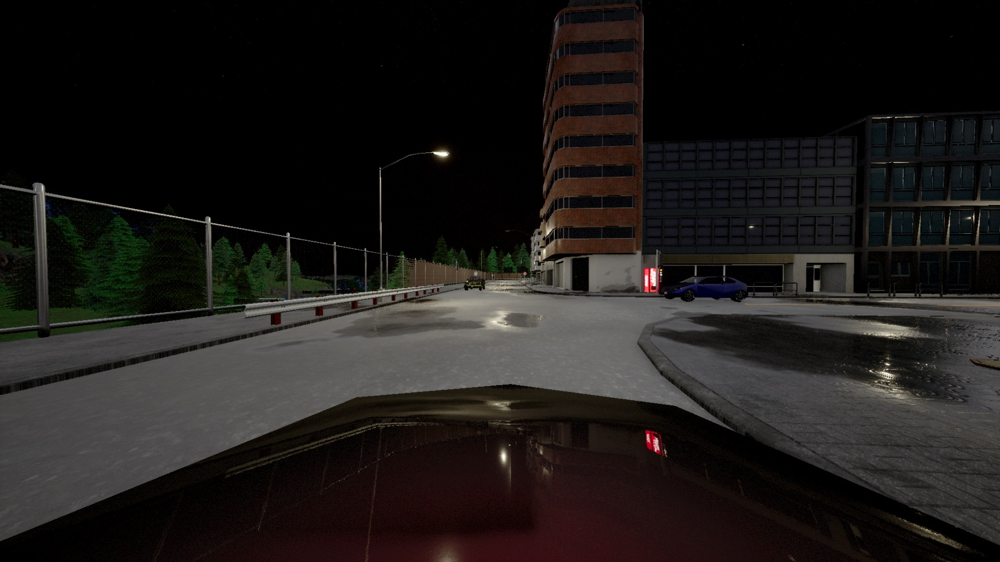

🤖 Generating response...

📸 IMAGE: seed2025_Town01_MidRainNight_intersection87_frontview_0004.jpg
----------------------------------------------------------------------
❓ QUESTION:
Quel véhicule a la priorité dans cette intersection?

Options:
A) Le véhicule venant de gauche
B) Le véhicule venant de droite  
C) Le véhicule tout droit
D) Aucun véhicule

Donne la lettre correcte et explique pourquoi.
----------------------------------------------------------------------
🎯 MODEL RESPONSE:
La lettre correcte est A) Le véhicule venant de gauche. 

La raison est que dans une intersection, le véhicule qui a le droit de l'aller est le premier à passer. Dans cette situation, le véhicule venant de gauche a le droit de l'aller, car il est plus à l'avant et à l'arrière.


In [126]:
# ============================
# SIMPLE TEST FOR KAGGLE (WITH IMAGE DISPLAY)
# ============================

import torch
from PIL import Image
from pathlib import Path
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info

# For displaying the image
from IPython.display import display

# Load your fine-tuned model
model_path = "./driveqa_qwen2vl_finetuned"

print("📥 Loading model...")
processor = AutoProcessor.from_pretrained(model_path, trust_remote_code=True)
model = Qwen2VLForConditionalGeneration.from_pretrained(
    model_path,
    device_map="auto",
    torch_dtype=torch.float16,
    trust_remote_code=True
)
model.eval()
print("✅ Model loaded!\n")

# Test on an image
test_image_path = "/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images/seed2025_Town01_ClearNoon_intersection1569_frontview_0030.jpg"

# Verify image exists
if not Path(test_image_path).exists():
    # Find any available image
    images_dir = Path("/kaggle/working/driveqa_images/intersections/intersection_VQA/T_intersection/seed2025/front_view/Town01/images")
    available_images = list(images_dir.glob("*.jpg"))
    if available_images:
        test_image_path = str(available_images[0])
        print(f"📌 Using image: {Path(test_image_path).name}")
    else:
        print("❌ No images found!")
        exit()

# Load image
image = Image.open(test_image_path).convert("RGB")

# Display the image
print("📸 Displaying image:")
display(image)  # ✅ Visualisation de l'image

# Create question
question = """Quel véhicule a la priorité dans cette intersection?

Options:
A) Le véhicule venant de gauche
B) Le véhicule venant de droite  
C) Le véhicule tout droit
D) Aucun véhicule

Donne la lettre correcte et explique pourquoi."""

# Prepare input in Qwen2-VL format
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": question}
        ]
    }
]

# Process
text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
image_inputs, video_inputs = process_vision_info(messages)

inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt"
).to("cuda")

# Generate
print("🤖 Generating response...\n")
with torch.no_grad():
    output_ids = model.generate(
        **inputs,
        max_new_tokens=512,
        temperature=0.7,
        top_p=0.9
    )

# Decode
generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
response = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]

# Display results
print("="*70)
print("📸 IMAGE:", Path(test_image_path).name)
print("-"*70)
print("❓ QUESTION:")
print(question)
print("-"*70)
print("🎯 MODEL RESPONSE:")
print(response)
print("="*70)


In [132]:
# ============================================================
# 🚗 DRIVEQA STREAMLIT - SOLUTION 1 CELLULE POUR KAGGLE
# ============================================================
# Copiez-collez tout ce code dans UNE SEULE cellule Kaggle
# ============================================================

import subprocess
import sys
import os

# Supprimer les warnings
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# 1️⃣ INSTALLATION
print("📦 Installation de Streamlit et ngrok...")
subprocess.run([sys.executable, "-m", "pip", "install", "-q", "streamlit", "pyngrok"], check=True)

# 2️⃣ CRÉER LE FICHIER STREAMLIT
print("📝 Création de l'application...")

APP_CODE = """
import streamlit as st
import torch
from PIL import Image
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info
import warnings
import os

warnings.filterwarnings("ignore")
os.environ["TOKENIZERS_PARALLELISM"] = "false"

st.set_page_config(page_title="DriveQA", page_icon="🚗", layout="wide")
st.title("🚗 DriveQA - AI Driving Instructor")
st.markdown("---")

@st.cache_resource
def load_model():
    processor = AutoProcessor.from_pretrained("./driveqa_qwen2vl_finetuned", trust_remote_code=True)
    model = Qwen2VLForConditionalGeneration.from_pretrained(
        "./driveqa_qwen2vl_finetuned",
        device_map="auto",
        torch_dtype=torch.float16,
        trust_remote_code=True
    )
    model.eval()
    return processor, model

processor, model = load_model()
st.success("✅ Modèle chargé!")

col1, col2 = st.columns(2)

with col1:
    st.header("📸 Image")
    uploaded_file = st.file_uploader("Upload", type=["jpg", "jpeg", "png"])
    if uploaded_file:
        image = Image.open(uploaded_file).convert("RGB")
        st.image(image, use_container_width=True)

with col2:
    st.header("❓ Question")
    question = st.text_area("Votre question:", height=150, 
                            placeholder="Ex: Qui a la priorité?")

if st.button("🚀 Générer", type="primary"):
    if uploaded_file and question:
        with st.spinner("Analyse..."):
            messages = [{
                "role": "user",
                "content": [
                    {"type": "image", "image": image},
                    {"type": "text", "text": question}
                ]
            }]
            
            text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
            image_inputs, video_inputs = process_vision_info(messages)
            inputs = processor(text=[text], images=image_inputs, videos=video_inputs, 
                             padding=True, return_tensors="pt").to("cuda")
            
            with torch.no_grad():
                output_ids = model.generate(**inputs, max_new_tokens=512, temperature=0.7)
            
            generated_ids = [output_ids[0][len(inputs.input_ids[0]):]]
            response = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
            
            st.markdown("---")
            st.header("🎯 Réponse")
            st.success(response)
    else:
        st.error("Veuillez uploader une image et poser une question!")
"""

with open("app.py", "w", encoding="utf-8") as f:
    f.write(APP_CODE)

print("✅ app.py créé!")

# 3️⃣ LANCER NGROK
print("\n🌐 Création du tunnel public...")

try:
    from pyngrok import ngrok
    public_url = ngrok.connect(8501)
    print(f"\n{'='*70}")
    print(f"🎉 VOTRE APP EST DISPONIBLE ICI:")
    print(f"   {public_url}")
    print(f"{'='*70}\n")
except Exception as e:
    print(f"⚠️ Erreur ngrok: {e}\n")

# 4️⃣ LANCER STREAMLIT
print("⏳ Lancement de Streamlit...\n")

subprocess.run([
    "streamlit", "run", "app.py",
    "--server.port", "8501",
    "--server.headless", "true"
])

📦 Installation de Streamlit et ngrok...
📝 Création de l'application...
✅ app.py créé!

🌐 Création du tunnel public...


ERROR:pyngrok.process.ngrok:t=2026-02-12T04:40:46+0000 lvl=eror msg="failed to reconnect session" obj=tunnels.session err="authentication failed: Usage of ngrok requires a verified account and authtoken.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nInstall your authtoken: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"
ERROR:  authentication failed: Usage of ngrok requires a verified account and authtoken.
ERROR:  
ERROR:  Sign up for an account: https://dashboard.ngrok.com/signup
ERROR:  Install your authtoken: https://dashboard.ngrok.com/get-started/your-authtoken
ERROR:  
ERROR:  ERR_NGROK_4018
ERROR:  https://ngrok.com/docs/errors/err_ngrok_4018
ERROR:  
ERROR:pyngrok.process.ngrok:t=2026-02-12T04:40:46+0000 lvl=eror msg="session closing" obj=tunnels.session err="authentication failed: Usage of ngrok requires a verified account and authtoken.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nInstall your authtoken: ht

⚠️ Erreur ngrok: The ngrok process errored on start: authentication failed: Usage of ngrok requires a verified account and authtoken.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nInstall your authtoken: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n.

⏳ Lancement de Streamlit...




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.19.2.2:8501
  External URL: http://136.114.67.238:8501

  Stopping...


KeyboardInterrupt: 

In [135]:
import subprocess
import sys

# Installer Streamlit
subprocess.run([sys.executable, "-m", "pip", "install", "-q", "streamlit"], check=True)

# Créer le fichier app
with open("app.py", "w") as f:
    f.write("""
import streamlit as st
import torch
from PIL import Image
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info
import warnings, os

warnings.filterwarnings("ignore")
os.environ["TOKENIZERS_PARALLELISM"] = "false"

st.title("🚗 DriveQA - AI Driving Instructor")

@st.cache_resource
def load_model():
    processor = AutoProcessor.from_pretrained("./driveqa_qwen2vl_finetuned", trust_remote_code=True)
    model = Qwen2VLForConditionalGeneration.from_pretrained(
        "./driveqa_qwen2vl_finetuned", device_map="auto", torch_dtype=torch.float16, trust_remote_code=True
    )
    model.eval()
    return processor, model

processor, model = load_model()
st.success("✅ Modèle chargé!")

uploaded = st.file_uploader("📸 Upload Image", type=["jpg", "png"])
question = st.text_area("❓ Votre Question", placeholder="Ex: Qui a la priorité?")

if st.button("🔍 Analyser", type="primary") and uploaded and question:
    with st.spinner("Analyse en cours..."):
        image = Image.open(uploaded).convert("RGB")
        messages = [{"role": "user", "content": [{"type": "image", "image": image}, {"type": "text", "text": question}]}]
        text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        img_in, vid_in = process_vision_info(messages)
        inputs = processor(text=[text], images=img_in, videos=vid_in, padding=True, return_tensors="pt").to("cuda")
        
        with torch.no_grad():
            output = model.generate(**inputs, max_new_tokens=512, temperature=0.7)
        
        response = processor.batch_decode([output[0][len(inputs.input_ids[0]):]], skip_special_tokens=True)[0]
        
        st.markdown("---")
        st.header("🎯 Réponse")
        st.success(response)
""")

print("✅ App créée : app.py")

✅ App créée : app.py


In [136]:
# ⚠️ Cette cellule va bloquer - c'est normal !
# Kaggle affichera un lien pour ouvrir l'app sur le port 8501

!streamlit run app.py --server.port 8501 --server.headless true




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.19.2.2:8501
  External URL: http://136.114.67.238:8501

^C
  Stopping...


In [137]:
import subprocess
import sys
subprocess.run([sys.executable, "-m", "pip", "install", "-q", "streamlit"], check=True)
print("✅ Streamlit installé!")

✅ Streamlit installé!


In [138]:
import torch
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
import warnings
import os

warnings.filterwarnings("ignore")
os.environ["TOKENIZERS_PARALLELISM"] = "false"

print("⏳ Pré-chargement du modèle... (cela prend 20-30 sec)")

processor = AutoProcessor.from_pretrained("./driveqa_qwen2vl_finetuned", trust_remote_code=True)
model = Qwen2VLForConditionalGeneration.from_pretrained(
    "./driveqa_qwen2vl_finetuned",
    device_map="auto",
    torch_dtype=torch.float16,
    trust_remote_code=True
)
model.eval()

print("✅ Modèle chargé en mémoire!")
print(f"📊 VRAM utilisée : {torch.cuda.memory_allocated()/1e9:.2f} GB")

⏳ Pré-chargement du modèle... (cela prend 20-30 sec)


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Modèle chargé en mémoire!
📊 VRAM utilisée : 15.07 GB


In [139]:
with open("app.py", "w") as f:
    f.write("""
import streamlit as st
import torch
from PIL import Image
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info
import warnings, os

warnings.filterwarnings("ignore")
os.environ["TOKENIZERS_PARALLELISM"] = "false"

st.title("🚗 DriveQA - AI Driving Instructor")

# ⚡ OPTIMISATION : Le modèle est déjà chargé dans la session Kaggle
# Streamlit va juste le réutiliser via le cache
@st.cache_resource
def load_model():
    processor = AutoProcessor.from_pretrained("./driveqa_qwen2vl_finetuned", trust_remote_code=True)
    model = Qwen2VLForConditionalGeneration.from_pretrained(
        "./driveqa_qwen2vl_finetuned", device_map="auto", torch_dtype=torch.float16, trust_remote_code=True
    )
    model.eval()
    return processor, model

processor, model = load_model()
st.success("✅ Prêt!")

col1, col2 = st.columns(2)

with col1:
    st.header("📸 Image")
    uploaded = st.file_uploader("Upload", type=["jpg", "png"])
    if uploaded:
        image = Image.open(uploaded).convert("RGB")
        st.image(image, use_container_width=True)

with col2:
    st.header("❓ Question")
    question = st.text_area("Votre question:", height=120)

if st.button("🔍 Analyser", type="primary"):
    if uploaded and question:
        with st.spinner("Analyse..."):
            image = Image.open(uploaded).convert("RGB")
            messages = [{"role": "user", "content": [{"type": "image", "image": image}, {"type": "text", "text": question}]}]
            text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
            img_in, vid_in = process_vision_info(messages)
            inputs = processor(text=[text], images=img_in, videos=vid_in, padding=True, return_tensors="pt").to("cuda")
            
            with torch.no_grad():
                output = model.generate(**inputs, max_new_tokens=512, temperature=0.7)
            
            response = processor.batch_decode([output[0][len(inputs.input_ids[0]):]], skip_special_tokens=True)[0]
            st.success(response)
    else:
        st.warning("Uploadez une image et posez une question!")
""")

print("✅ app.py créée!")

✅ app.py créée!


In [140]:
!streamlit run app.py --server.port 8501 --server.headless true




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.19.2.2:8501
  External URL: http://136.114.67.238:8501

^C
  Stopping...


In [142]:
import subprocess
import sys

# Installation
print("📦 Installation de Gradio...")
subprocess.run([sys.executable, "-m", "pip", "install", "-q", "gradio"], check=True)

import gradio as gr
import torch
from PIL import Image
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info
import warnings
import os

warnings.filterwarnings("ignore")
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Charger le modèle
print("\n⏳ Chargement du modèle DriveQA...")
processor = AutoProcessor.from_pretrained("./driveqa_qwen2vl_finetuned", trust_remote_code=True)
model = Qwen2VLForConditionalGeneration.from_pretrained(
    "./driveqa_qwen2vl_finetuned",
    device_map="auto",
    torch_dtype=torch.float16,
    trust_remote_code=True
)
model.eval()
print("✅ Modèle chargé!\n")

# Fonction d'analyse
def analyze_driving_scenario(image, question):
    """Analyse une image de conduite et répond à la question"""
    
    if image is None:
        return "⚠️ Veuillez uploader une image."
    
    if not question or question.strip() == "":
        return "⚠️ Veuillez poser une question."
    
    try:
        # Préparer le message
        messages = [{
            "role": "user",
            "content": [
                {"type": "image", "image": image},
                {"type": "text", "text": f"Tu es un instructeur de conduite expert. {question}"}
            ]
        }]
        
        # Préparation
        text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        image_inputs, video_inputs = process_vision_info(messages)
        inputs = processor(text=[text], images=image_inputs, videos=video_inputs, 
                          padding=True, return_tensors="pt").to("cuda")
        
        # Génération
        with torch.no_grad():
            output_ids = model.generate(
                **inputs,
                max_new_tokens=512,
                temperature=0.7,
                top_p=0.9
            )
        
        # Décodage
        response = processor.batch_decode(
            [output_ids[0][len(inputs.input_ids[0]):]],
            skip_special_tokens=True
        )[0]
        
        return response
        
    except Exception as e:
        return f"❌ Erreur: {str(e)}"

# Créer l'interface Gradio
demo = gr.Interface(
    fn=analyze_driving_scenario,
    inputs=[
        gr.Image(type="pil", label="📸 Image de conduite"),
        gr.Textbox(
            label="❓ Votre question",
            placeholder="Ex: Quel véhicule a la priorité dans cette intersection?",
            lines=3
        )
    ],
    outputs=gr.Textbox(label="🎯 Réponse de l'IA", lines=10),
    title="🚗 DriveQA - AI Driving Instructor",
    description="""
    **Analysez des scénarios de conduite avec l'IA**
    
    1. Uploadez une image de situation de conduite
    2. Posez votre question
    3. Recevez une réponse détaillée d'un instructeur IA
    
    *Propulsé par Qwen2-VL fine-tuné sur DriveQA*
    """,
    examples=[
        [None, "Quel véhicule a la priorité dans cette intersection?"],
        [None, "Quels sont les dangers potentiels dans cette situation?"],
        [None, "Quelle action le conducteur devrait-il prendre?"],
        [None, "Y a-t-il une infraction au code de la route visible?"]
    ],
    theme=gr.themes.Soft(),
    allow_flagging="never"
)

# Lancer l'application
print("🚀 Lancement de l'application Gradio...\n")
print("="*70)
print("🎉 VOTRE APPLICATION VA S'OUVRIR AUTOMATIQUEMENT")
print("="*70)
print("\nGradio va générer une URL publique (https://xxxxx.gradio.live)")
print("Cette URL sera valide pendant 72 heures.\n")

# share=True crée automatiquement une URL publique accessible depuis n'importe où !
demo.launch(share=True, debug=False)




📦 Installation de Gradio...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 444.8/444.8 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 12.8 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.22.1 requires google-cloud-bigquery-storage>=2.0.0, which is not installed.
langchain-core 0.3.79 requires packaging<26.0.0,>=23.2.0, but you have packaging 26.0rc2 which is incompatible.
fastai 2.8.4 requires fastcore<1.9,>=1.8.0, but you have fastcore 1.11.3 which is incompatible.



⏳ Chargement du modèle DriveQA...


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Modèle chargé!

🚀 Lancement de l'application Gradio...

🎉 VOTRE APPLICATION VA S'OUVRIR AUTOMATIQUEMENT

Gradio va générer une URL publique (https://xxxxx.gradio.live)
Cette URL sera valide pendant 72 heures.

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://eb1d63111a87c8f187.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
